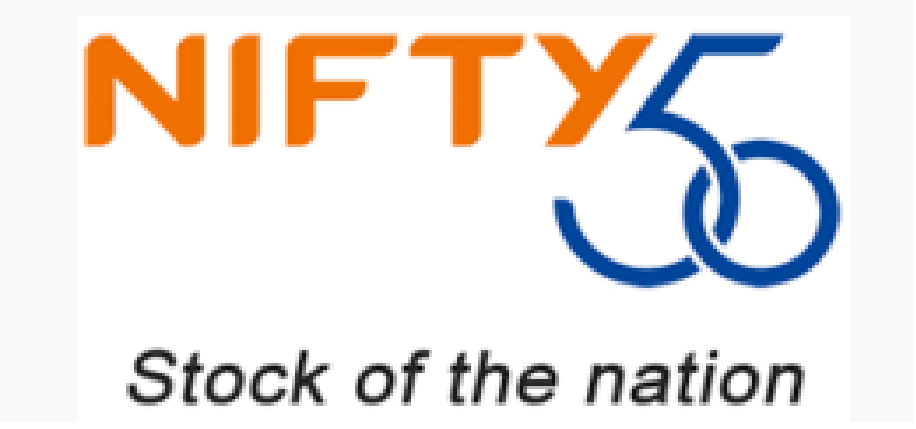

In [1]:
from IPython.display import Image
Image("../input/nifty51/9.PNG")

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
%matplotlib inline
from pandas_profiling import ProfileReport

data = pd.read_csv('../input/nifty-indices-dataset/NIFTY 50.csv')
data['Date'] = pd.to_datetime(data['Date'])
data['year'] = data['Date'].dt.year
data['month'] = data['Date'].dt.month
data['day'] = data['Date'].dt.day

# Report of Nifty 50 data

In [3]:
report = ProfileReport(data)

In [4]:
report

/opt/conda/lib/python3.7/site-packages/IPython/core/display.py:701: UserWarning: Consider using IPython.display.IFrame instead
  warnings.warn("Consider using IPython.display.IFrame instead")


# Nifty graph in the last 2 decades

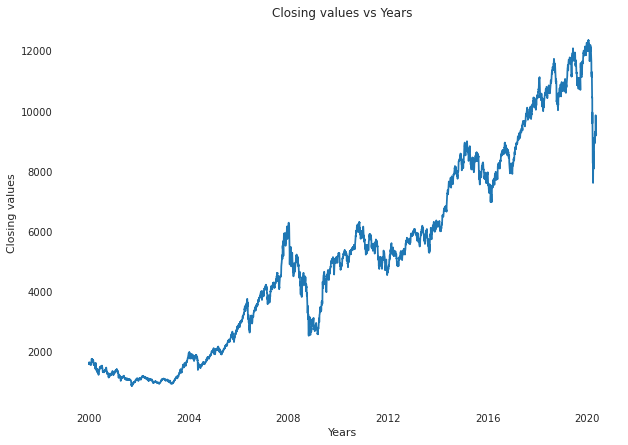

In [5]:
plt.figure(figsize=(10,7))
plt.plot(data['Date'],data['Close'])
plt.xlabel('Years')
plt.ylabel('Closing values')
plt.title('Closing values vs Years')
plt.show()

# What years had the highest 5 peaks? ---> 2015,2017,2018,2019,2020

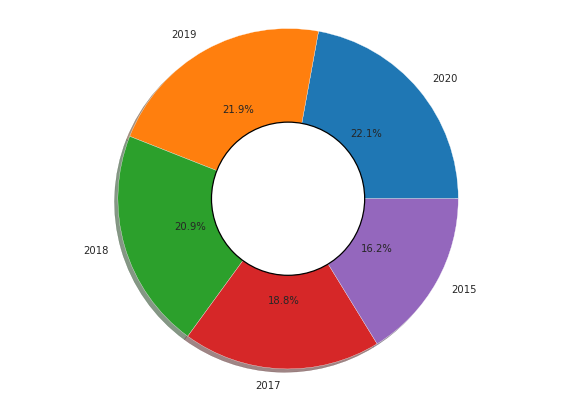

In [6]:
peaks = data.loc[:, ['year','High']]
peaks['max_high'] = peaks.groupby('year')['High'].transform('max')
peaks.drop('High', axis=1, inplace=True)
peaks = peaks.drop_duplicates()
peaks = peaks.sort_values('max_high', ascending=False)
peaks = peaks.head()

fig = plt.figure(figsize=(10,7))
plt.pie(peaks['max_high'], labels=peaks['year'], autopct='%1.1f%%', shadow=True)
centre_circle = plt.Circle((0,0),0.45,color='black', fc='white',linewidth=1.25)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.axis('equal')
plt.show()

## From the above donut plot it seems that the prices were low in the year 2016

# Distribution of the highest values

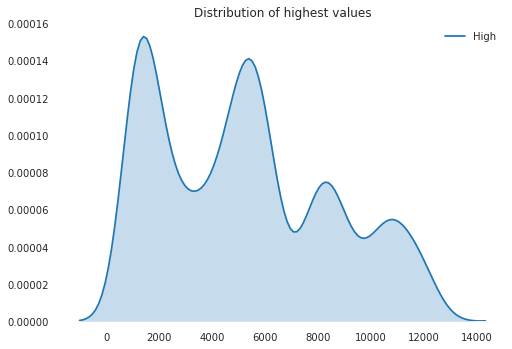

In [7]:
sns.kdeplot(data=data['High'], shade=True)
plt.title('Distribution of highest values')
plt.show()

# Distribution of transaction volume

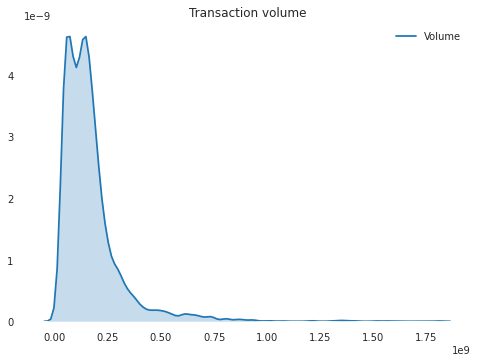

In [8]:
sns.kdeplot(data=data['Volume'], shade=True)
plt.title('Transaction volume')
plt.show()

# Volume of transactions per year

In [9]:
top_5_genres = [1,3,5,7,9,11]
perc = data.loc[:,["year","month",'Volume']]
perc['new_volume'] = perc.groupby([perc.month,perc.year])['Volume'].transform('mean')
perc.drop('Volume', axis=1, inplace=True)
perc = perc[perc.year<2020]
perc = perc.drop_duplicates()
perc = perc.loc[perc['month'].isin(top_5_genres)]
perc = perc.sort_values("year")

fig=px.bar(perc,x='month', y="new_volume", animation_frame="year", 
           animation_group="month", color="month", hover_name="month", range_y=[perc['new_volume'].min(), perc['new_volume'].max()])
fig.update_layout(showlegend=False)
fig.show()

# Relation of Volume to stock prices

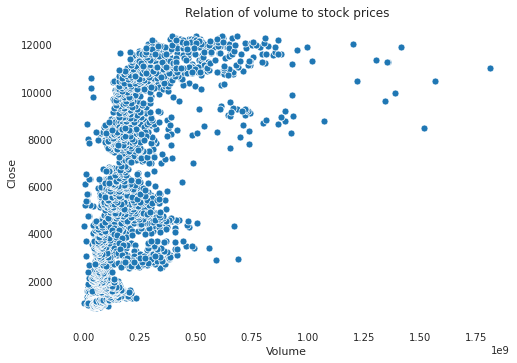

In [10]:
sns.scatterplot(data=data, x='Volume', y='Close')
plt.title('Relation of volume to stock prices')
plt.show()

# What is turnover?

Turnover is the net sales generated by a business, while profit is the residual earnings of a business after all expenses have been charged against net sales. Thus, turnover and profit are essentially the beginning and ending points of the income statement - the top-line revenues and the bottom-line results.

# Distribution of Turnover

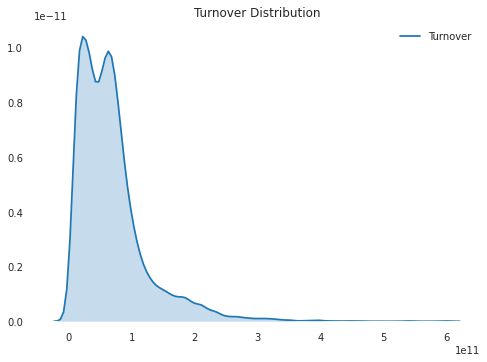

In [11]:
sns.kdeplot(data=data['Turnover'], shade=True)
plt.title('Turnover Distribution')
plt.show()

# Relation of turnover to Volume

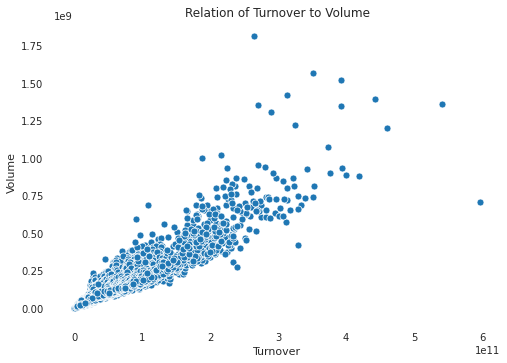

In [12]:
sns.scatterplot(data=data, x='Turnover', y='Volume')
plt.title('Relation of Turnover to Volume')
plt.show()

# Monthly Turnover per year

In [13]:
turn = data.loc[:,['year','month','Turnover']]
turn['monthly_turnover'] = turn.groupby([turn.year,turn.month])['Turnover'].transform('mean')
turn.drop('Turnover', axis=1, inplace=True)
turn = turn.drop_duplicates()
fig = px.scatter(turn, x="month", y="monthly_turnover", animation_frame="year", animation_group="month", color="month", hover_name="month", size_max=1000 \
                , range_y=[turn['monthly_turnover'].min(), turn['monthly_turnover'].max()])
fig.update_traces(marker=dict(size=12,
                              line=dict(width=2,
                                        color='DarkSlateGrey')),
                  selector=dict(mode='markers'))
fig.show()

# What is price to earnings ratio?

The price to earnings ratio (PE Ratio) is the measure of the share price relative to the annual net income earned by the firm per share. PE ratio shows current investor demand for a company share. A high PE ratio generally indicates increased demand because investors anticipate earnings growth in the future.

# Distribution of the P/E ratio

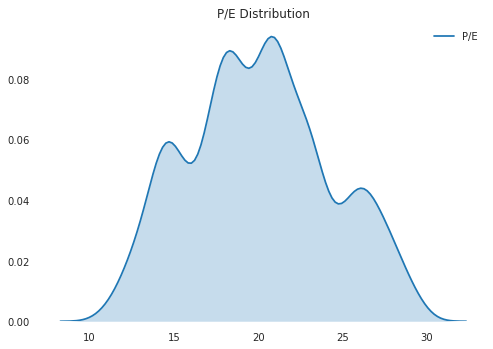

In [14]:
sns.kdeplot(data=data['P/E'], shade=True)
plt.title('P/E Distribution')
plt.show()

# Relation of P/E ratio to Close values

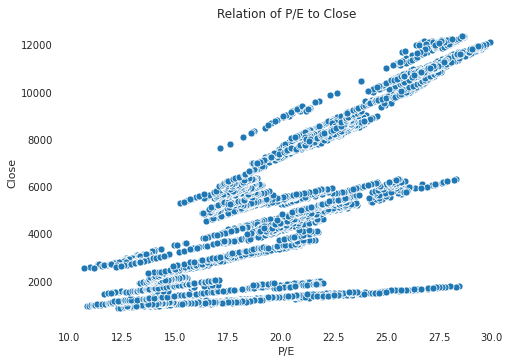

In [15]:
sns.scatterplot(data=data, x='P/E', y='Close')
plt.title('Relation of P/E to Close')
plt.show()

### Since price/earnings is an yearly concept. Let's check the yearly graph.

# Yearly graph of P/E

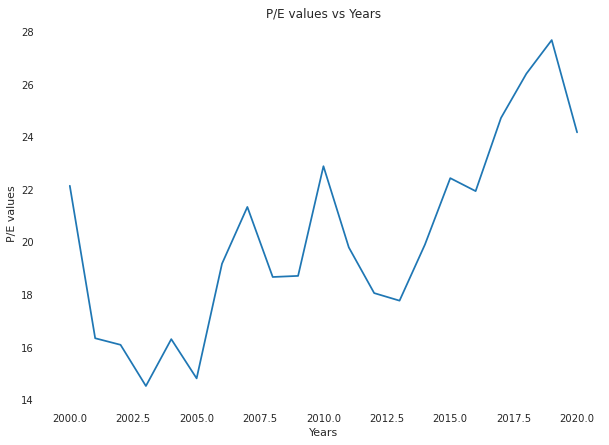

In [16]:
df = data.loc[:,['year','P/E']]
df['meanPE'] = df.groupby('year')['P/E'].transform('mean')
df.drop('P/E',axis=1, inplace=True)
df = df.drop_duplicates().sort_values('year')


plt.figure(figsize=(10,7))
plt.plot(df['year'],df['meanPE'])
plt.xlabel('Years')
plt.ylabel('P/E values')
plt.title('P/E values vs Years')
plt.show()

A huge rise is observed from 2005-2007. This signifies that investors anticipated earning growth in future.

But then there is a huge fall from 2008. I am assuming this fall is due to the 
#### **State Bank of Saurashtra scam of 2008**.

Similar cases can be seen in 2011. This may be due to the 
#### Belekari Port Scam of 2011

# What is P/B?

The price-to-book (P/B) ratio has been favored by value investors for decades and is widely used by market analysts. Traditionally, any value under 1.0 is considered a good P/B value, indicating a potentially undervalued stock. However, value investors often consider stocks with a P/B value under 3.0

# Distribution of P/B

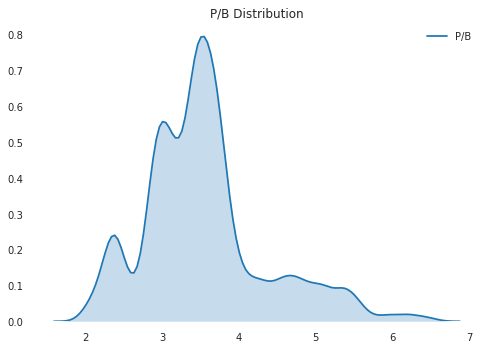

In [17]:
sns.kdeplot(data=data['P/B'], shade=True)
plt.title('P/B Distribution')
plt.show()

# Relation of P/B to Close values

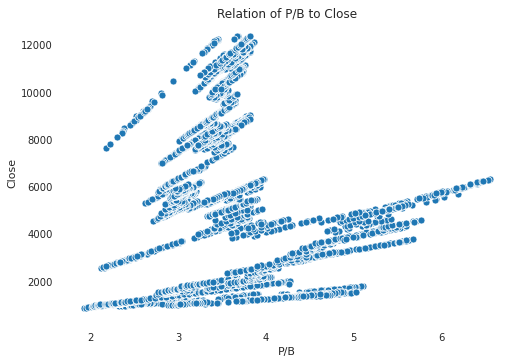

In [18]:
sns.scatterplot(data=data, x='P/B', y='Close')
plt.title('Relation of P/B to Close')
plt.show()

It can be noticed that the highest closing stock prices are yielded for a P/B ratio between 3 to 4. 

So a higher P/B vaue than 4 don't indicate better prices.

# Yearly graph of P/B

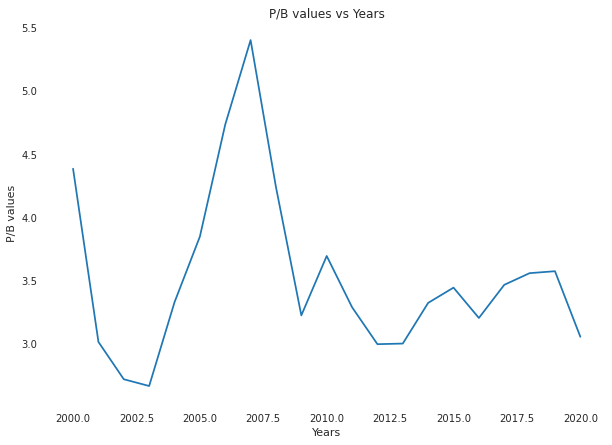

In [19]:
df = data.loc[:,['year','P/B']]
df['meanPB'] = df.groupby('year')['P/B'].transform('mean')
df.drop('P/B',axis=1, inplace=True)
df = df.drop_duplicates().sort_values('year')


plt.figure(figsize=(10,7))
plt.plot(df['year'],df['meanPB'])
plt.xlabel('Years')
plt.ylabel('P/B values')
plt.title('P/B values vs Years')
plt.show()

Since 2003 the graph sees a huge rise and huge fall from 2006.

I don't know what this signifies but I think I need to analyze the years 2005-2009 separately because these years show some really interesting stats

Whether it be for the scams or something else will find it out.

# What is Dividend yield?

Dividend yield equals the annual dividend per share divided by the stock's price per share. For example, if a company's annual dividend is \$1.50 and the stock trades at \$25, the dividend yield is 6% (\$1.50 ÷ $25)

# Distribution of Dividend Yield

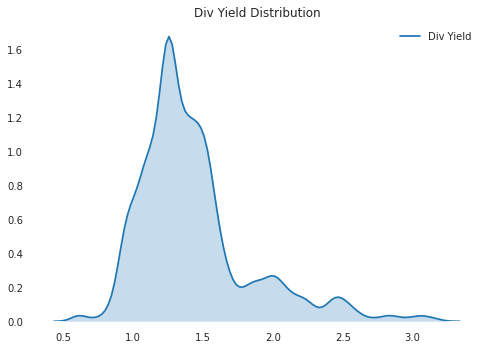

In [20]:
sns.kdeplot(data=data['Div Yield'], shade=True)
plt.title('Div Yield Distribution')
plt.show()

# Relation of Dividend yield to Closing stock prices

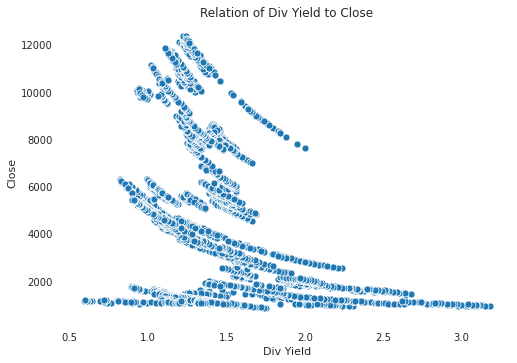

In [21]:
sns.scatterplot(data=data, x='Div Yield', y='Close')
plt.title('Relation of Div Yield to Close')
plt.show()

A dividend yield between 1 to 1.5 seems to be the best for the stock prices

# Dividend yield per year

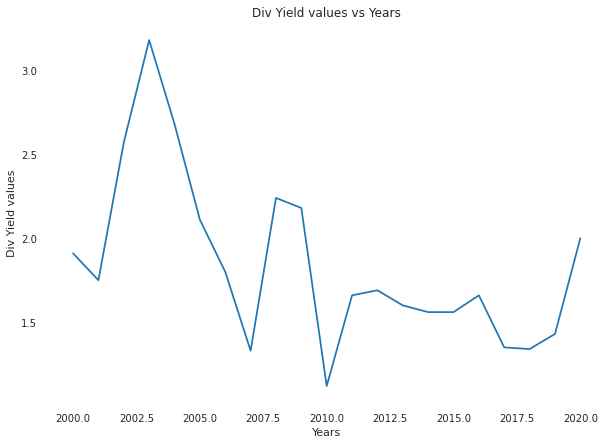

In [22]:
df = data.loc[:,['year','Div Yield']]
df['meandiv'] = df.groupby('year')['Div Yield'].transform('max')
df.drop('Div Yield',axis=1, inplace=True)
df = df.drop_duplicates().sort_values('year')


plt.figure(figsize=(10,7))
plt.plot(df['year'],df['meandiv'])
plt.xlabel('Years')
plt.ylabel('Div Yield values')
plt.title('Div Yield values vs Years')
plt.show()

# Why dividend yield value decrease?

During recessions or otherwise uncertain times, dividend-paying stocks can rapidly decrease in value because there is a risk that future dividends will be reduced. If a company announces that it's lowering its dividend, the stock price will react immediately.

# P/E - P/B - Div Yield vs Years

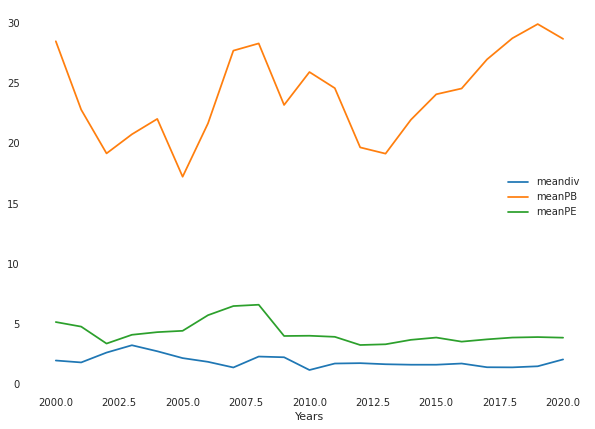

In [23]:
df = data.loc[:,['year','P/B','P/E','Div Yield']]
df[['meanPE','meanPB','meandiv']] = df.groupby('year')[['P/B','P/E','Div Yield']].transform('max')
df.drop(['P/B','P/E','Div Yield'],axis=1, inplace=True)
df = df.drop_duplicates().sort_values('year')


plt.figure(figsize=(10,7))
plt.plot(df['year'],df['meandiv'], label='meandiv')
plt.plot(df['year'],df['meanPB'], label='meanPB')
plt.plot(df['year'],df['meanPE'], label='meanPE')
plt.xlabel('Years')
plt.legend()
plt.show()